In [1]:
!pip install nlp
!pip install shap
!pip install transformers
!pip install transformers-interpret

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 17.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.5/110.5 kB 8.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.5/212.5 kB 23.1 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 572.6/572.6 kB 11.4 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.2/7.2 MB 60.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 236.8/236.8 kB 25.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 84.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 61.8 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.

In [2]:
pip install lime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 6.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283839 sha256=c8cf18a2b777ac3edff7b4db56029b4dea7f08717d1ac546f97bbdfd98a94bc6
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
import torch
import pandas as pd
import scipy as sp
import numpy as np
import torch.nn as nn
import transformers
from transformers import AutoTokenizer, AutoModelForSequenceClassification
from torch.utils.data import DataLoader, Dataset

In [5]:
from lime.lime_text import LimeTextExplainer

In [6]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


In [7]:
num_classes = 2
num_epochs = 101
batch_size = 32
hidden_dim = 256
max_length = 256

In [8]:
tokenizer = AutoTokenizer.from_pretrained("dmis-lab/biobert-base-cased-v1.1")
model = AutoModelForSequenceClassification.from_pretrained("dmis-lab/biobert-base-cased-v1.1")
model.classifier = nn.Sequential(
    nn.Linear(model.config.hidden_size, hidden_dim),
    nn.ReLU(),
    nn.Dropout(0.2),
    nn.Linear(hidden_dim, num_classes)
)
model.load_state_dict(torch.load("drive/MyDrive/biobert_fine_tuned_epoch_16.pt")['model_state_dict'])
model.to(device)
print()

Some weights of the model checkpoint at dmis-lab/biobert-base-cased-v1.1 were not used when initializing BertForSequenceClassification: ['cls.seq_relationship.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.dense.weight', 'cls.seq_relationship.bias', 'cls.predictions.decoder.weight', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.decoder.bias']
- This IS expected if you are initializing BertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of BertForSequenceClassification we

In [9]:
import torch.nn as nn
# def f(x):
#     tv = torch.tensor([tokenizer.encode(v, padding='max_length', max_length=128, truncation=True) for v in x]).cuda()
#     attention_mask = (tv!=0).type(torch.int64).cuda()
#     outputs = model(tv,attention_mask=attention_mask)[0].detach().cpu().numpy()
#     scores = (np.exp(outputs).T / np.exp(outputs).sum(-1)).T
#     val = sp.special.logit(scores[:,1])
#     return val

# def f(text):
#     print("Calling function")
#     print(text)
#     with torch.no_grad():
#         #tv = torch.tensor([tokenizer.encode(v, padding='max_length', max_length=max_length, truncation=True) for v in texts]).cuda()
#         tv = torch.tensor([tokenizer.encode(text, padding='max_length', max_length=max_length, truncation=True)]).cuda()
#         a_mask = (tv!=0).type(torch.int64).cuda()
#         outputs = model(tv,attention_mask=a_mask)[0].cpu()
#         outputs = nn.functional.softmax(outputs, dim=1).numpy()
#         return outputs.tolist()

def f(texts):
    outputs = []
    for text in texts:
        with torch.no_grad():
            #tv = torch.tensor([tokenizer.encode(v, padding='max_length', max_length=max_length, truncation=True) for v in texts]).cuda()
            tv = torch.tensor([tokenizer.encode(text, padding='max_length', max_length=max_length, truncation=True)]).cuda()
            a_mask = (tv!=0).type(torch.int64).cuda()
            output = model(tv,attention_mask=a_mask)[0].cpu()
            output = nn.functional.softmax(output, dim=1).numpy()
            outputs.append(output)
#     print(np.array(outputs))
#     print(np.array(outputs[0]))
#     return np.array(outputs[0])
    outputs = np.array(outputs).reshape((-1, 2))
    return outputs

In [10]:
example = example = ('giant left atriuma case report seventysevenyear old woman with mitral stenosis presented with cardiomegaly evident her chest roentgenogram cardiac enlargement due giant left atrium that distorted cardiac structures echocardiogram and firstpass nuclear angiogram able delineate huge left atrium', 1)
text, label = example
f([text])

array([[0.15585633, 0.8441436 ]], dtype=float32)

In [11]:
# build an explainer using a token masker
example = example = ("giant left atriuma case report seventysevenyear old woman with mitral stenosis presented with cardiomegaly evident her chest roentgenogram cardiac enlargement due giant left atrium that distorted cardiac structures echocardiogram and firstpass nuclear angiogram able delineate huge left atrium", 1)
text, label = example
class_names = ['non_cardiovascular', 'cardiovascular']
explainer = LimeTextExplainer(class_names=class_names)
exp = explainer.explain_instance(text, f, num_features=6)

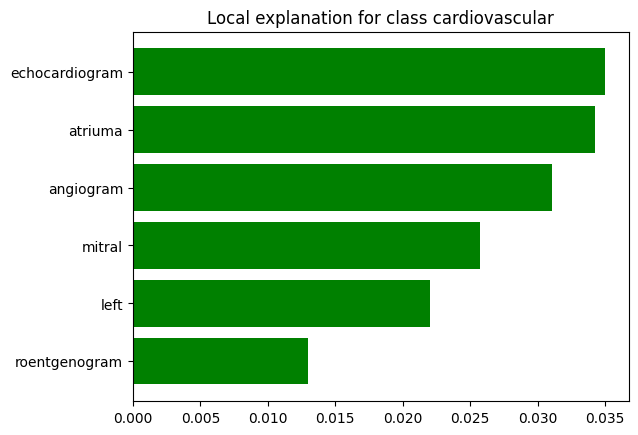

In [12]:
%matplotlib inline
fig = exp.as_pyplot_figure()

In [13]:
exp.show_in_notebook(text=True)

In [ ]:
#Examples to test

In [14]:
example = example = ("supravalvar aortic stenosis complication aortic valve surgery after patient had aortic valvotomy and aortotomy relief valvar aortic stenosis supravalvar stenosis developed over next six years",1)
text, label = example
class_names = ['non_cardiovascular', 'cardiovascular']
explainer = LimeTextExplainer(class_names=class_names)
exp = explainer.explain_instance(text, f, num_features=6)

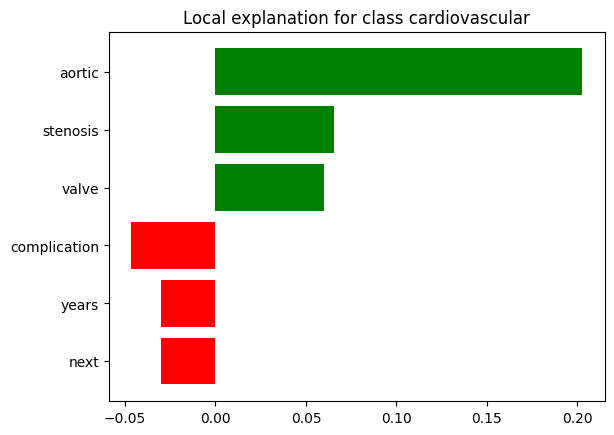

In [15]:
%matplotlib inline
fig = exp.as_pyplot_figure()

In [16]:
exp.show_in_notebook(text=True)

In [18]:
example = example = ("severe thrombocytopenia after paracetamol overdose two patients with severe thrombocytopenia after paracetamol overdose described platelet count lowest two days after overdose neither leucopenia nor anaemia occurred",0)
text, label = example
class_names = ['non_cardiovascular', 'cardiovascular']
explainer = LimeTextExplainer(class_names=class_names)
exp = explainer.explain_instance(text, f, num_features=6)

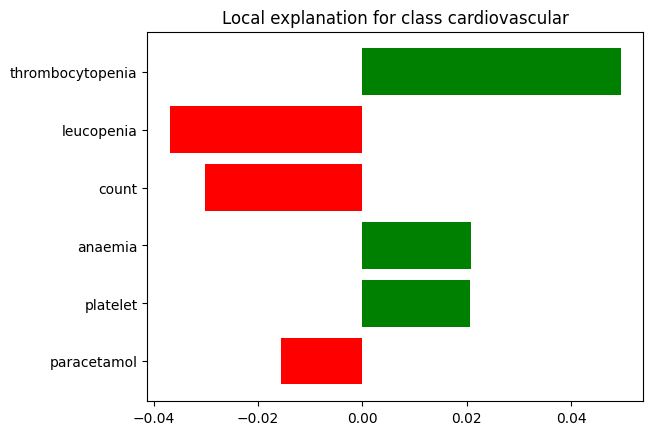

In [19]:
%matplotlib inline
fig = exp.as_pyplot_figure()

In [20]:
exp.show_in_notebook(text=True)

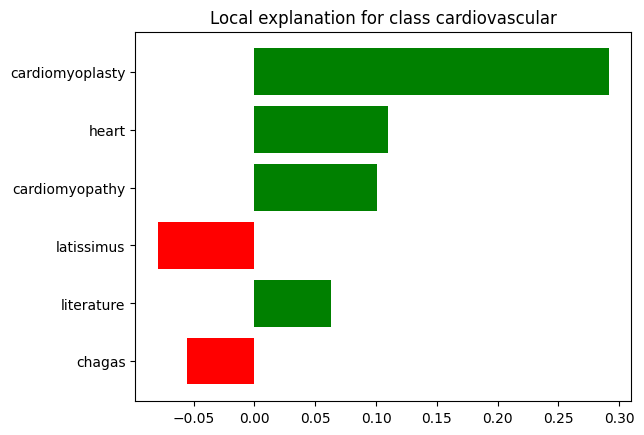

In [21]:
example = example = ("dynamic cardiomyoplasty chronic chagas heart disease clinicopathological data we report 44yearold man with chronic chagasic cardiomyopathy who underwent latissimus dorsi dynamic cardiomyoplasty and died 4 months later clinicopathological findings discussed and literature reviewed", 1)
text, label = example
class_names = ['non_cardiovascular', 'cardiovascular']
explainer = LimeTextExplainer(class_names=class_names)
exp = explainer.explain_instance(text, f, num_features=6)


%matplotlib inline
fig = exp.as_pyplot_figure()
exp.show_in_notebook(text=True)

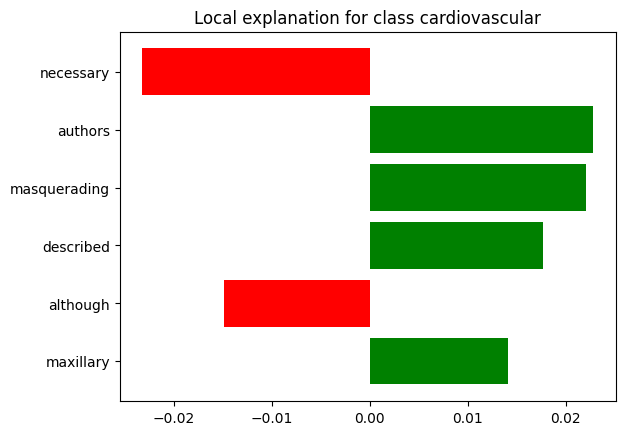

In [23]:
example = example = ("maxillary sinus hypoplasia masquerading as chronic sinusitis maxillary sinus hypoplasia common condition that may be misdiagnosed as chronic sinusitis although hypoplasia can usually be seen conventional sinus films computed tomography may be necessary as cases described by authors this article " ,0)
text, label = example
class_names = ['non_cardiovascular', 'cardiovascular']
explainer = LimeTextExplainer(class_names=class_names)
exp = explainer.explain_instance(text, f, num_features=6)


%matplotlib inline
fig = exp.as_pyplot_figure()
exp.show_in_notebook(text=True)

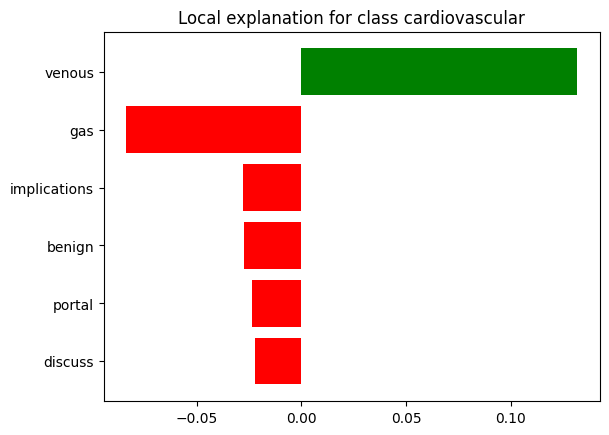

In [25]:
example = example = ("portal venous gas patient with crohns disease portal venous gas usually occurs setting acute abdomen several causes benign portal venous gas pvg have been reported we describe finding pvg by computed tomography febrile patient with crohns disease and discuss clinical implications such finding",0)
text, label = example
class_names = ['non_cardiovascular', 'cardiovascular']
explainer = LimeTextExplainer(class_names=class_names)
exp = explainer.explain_instance(text, f, num_features=6)


%matplotlib inline
fig = exp.as_pyplot_figure()
exp.show_in_notebook(text=True)

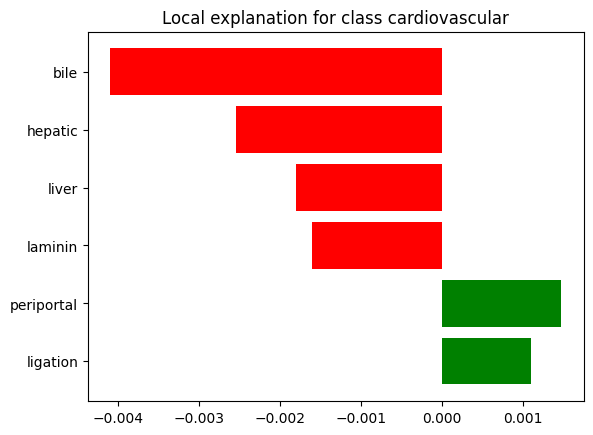

In [24]:
example = example = ("reversibility hepatic fibrosis experimentally induced cholestasis rat reversibility hepatic fibrosis investigated experimental model extrahepatic cholestasis rat after common bile duct ligation 2 weeks followed by bilioduodenal anastomosis 3 weeks bile duct ligation resulted transitory marked elevation serum concentration 5nucleotidase alkaline phosphatase and bilirubin during first 3 days then these levels decreased threefold twofold and 100fold normal values respectively during following 4 weeks histologic examination liver disclosed extensive bile duct proliferation and formation periportal fibrosis with only slight inflammation and necrosis distribution major components hepatic extracellular matrix analyzed 2 weeks after bile duct ligation using indirect immunoperoxidase method fibrous septa found be strongly stained collagens i proiii iii and iv fibronectin and laminin most intense staining found enlarged periportal areas collagen iv and laminin being particularly abundant around newly formed bile ducts these changes paralleled high steadystate levels alpha 1i and alpha 1iv collagen and b2 chain laminin mrnas relief obstruction 2 weeks resulted shift serum concentration 5nucleotidase alkaline phosphatase and bilirubin toward normal values dramatic resorption bile duct proliferations and periportal fibrosis observed three weeks after bile duct repermeabilization immunohistochemical study showed that pattern distribution extracellular matrix components almost normal except collagen iv which remained abundant sinusoids when compared with normal liver parallel steadystate b2chain laminin mrna level became lower than cholestatic livers whereas alpha 1i and alpha 1iv mrnas almost undetectable these results show that hepatic fibrosis induced by experimental extrahepatic cholestasis rat disappears less than 3 weeks after relief bile duct obstruction suggesting that active degradation matrix protein occurs except collagen iv sinusoid",0)
text, label = example
class_names = ['non_cardiovascular', 'cardiovascular']
explainer = LimeTextExplainer(class_names=class_names)
exp = explainer.explain_instance(text, f, num_features=6)


%matplotlib inline
fig = exp.as_pyplot_figure()
exp.show_in_notebook(text=True)

In [ ]:
rib compression coronary arteries this report describes finding coronary artery narrowing caused by compression by overlying rib two patients with cardiomegaly there probably no clinical significance this finding primary differential diagnostic entity myocardial bridging


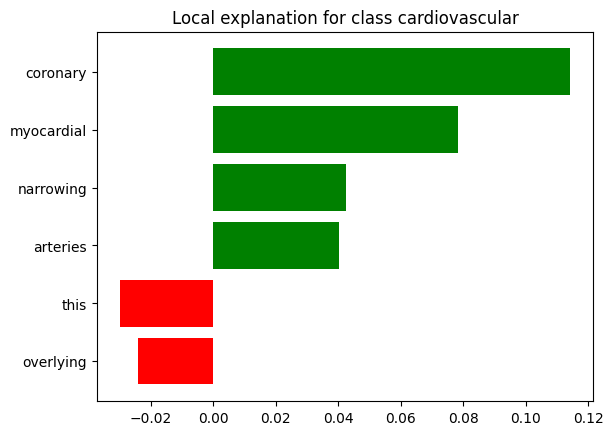

In [27]:
example = example = ("rib compression coronary arteries this report describes finding coronary artery narrowing caused by compression by overlying rib two patients with cardiomegaly there probably no clinical significance this finding primary differential diagnostic entity myocardial bridging ", 1)
text, label = example
class_names = ['non_cardiovascular', 'cardiovascular']
explainer = LimeTextExplainer(class_names=class_names)
exp = explainer.explain_instance(text, f, num_features=6)


%matplotlib inline
fig = exp.as_pyplot_figure()
exp.show_in_notebook(text=True)

In [ ]:
indomethacin responsive hypercalcaemia associated with renal sarcoma infant presented with nonmetastatic renal spindle cell sarcoma and hypercalcaemia which resolved after treatment with indomethacin there vivo and vitro evidence that hypercalcaemia mediated by circulatory prostaglandins


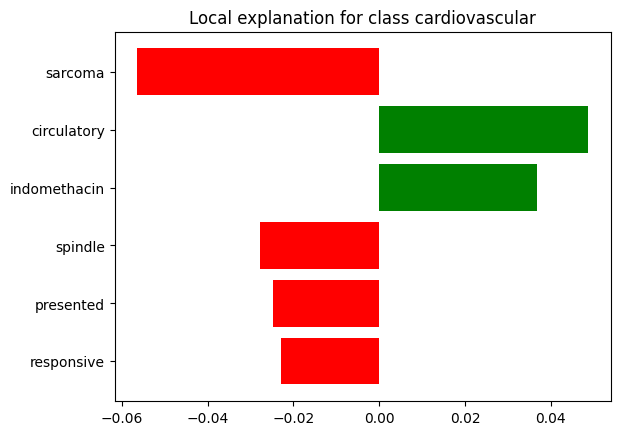

In [29]:
example = example = ("indomethacin responsive hypercalcaemia associated with renal sarcoma infant presented with nonmetastatic renal spindle cell sarcoma and hypercalcaemia which resolved after treatment with indomethacin there vivo and vitro evidence that hypercalcaemia mediated by circulatory prostaglandins", 0)
text, label = example
class_names = ['non_cardiovascular', 'cardiovascular']
explainer = LimeTextExplainer(class_names=class_names)
exp = explainer.explain_instance(text, f, num_features=6)


%matplotlib inline
fig = exp.as_pyplot_figure()
exp.show_in_notebook(text=True)

In [ ]:
meningitis due protozoa and helminths this article reviews microbiology pathogenesis epidemiology clinical manifestations diagnostic tests and recent advances therapy protozoan and helminthic infections central nervous system with more emphasis given protozoan than helminthic infections


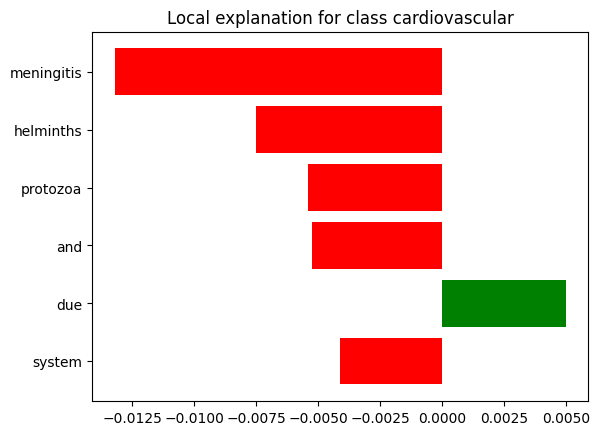

In [30]:
example = example = ("meningitis due protozoa and helminths this article reviews microbiology pathogenesis epidemiology clinical manifestations diagnostic tests and recent advances therapy protozoan and helminthic infections central nervous system with more emphasis given protozoan than helminthic infections", 0)
text, label = example
class_names = ['non_cardiovascular', 'cardiovascular']
explainer = LimeTextExplainer(class_names=class_names)
exp = explainer.explain_instance(text, f, num_features=6)


%matplotlib inline
fig = exp.as_pyplot_figure()
exp.show_in_notebook(text=True)